In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import os

In [3]:
uber_files=os.listdir(r'C:\Users\ninic\Downloads\uber-pickups-in-new-york-city-20211117T154739Z-001\uber-pickups-in-new-york-city') [-7:]
uber_files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
uber_files.remove('uber-raw-data-janjune-15.csv')
uber_files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [43]:
path=r'C:\Users\ninic\Downloads\uber-pickups-in-new-york-city-20211117T154739Z-001\uber-pickups-in-new-york-city'

final=pd.DataFrame()

for file in uber_files:
    uber_df=pd.read_csv(path+"/"+file,encoding='utf-8')
    final=pd.concat([final,uber_df])

In [44]:
final.shape

(4534327, 4)

In [45]:
uber_df=final.copy()
uber_df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [46]:
uber_df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [47]:
uber_df['Date/Time']=pd.to_datetime(uber_df['Date/Time'],format='%m/%d/%Y %H:%M:%S')

In [48]:
uber_df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [49]:
uber_df.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [50]:
uber_df['weekday']=uber_df['Date/Time'].dt.day_name()

In [51]:
uber_df['day']=uber_df['Date/Time'].dt.day

In [52]:
uber_df['month']=uber_df['Date/Time'].dt.month
uber_df['hour']=uber_df['Date/Time'].dt.hour
uber_df['minute']=uber_df['Date/Time'].dt.minute

In [53]:
uber_df.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,hour,minute
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,4,0,11
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,4,0,17
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,4,0,21
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,4,0,28
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,4,0,33


In [54]:
uber_df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
weekday              object
day                   int64
month                 int64
hour                  int64
minute                int64
dtype: object

In [55]:
!pip install plotly

In [56]:
##Analysis of journey by Week-days

In [57]:
import plotly.express as px

In [58]:
px.bar(x=uber_df['weekday'].value_counts().index,
      y=uber_df['weekday'].value_counts()
      )

(array([216928., 103517., 227152., 543565., 324851., 366329., 819491.,
        660869., 579117., 692508.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

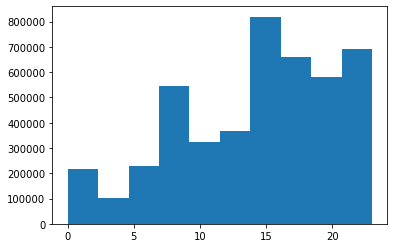

In [59]:
##Analysis of journey by hour in each month
plt.hist(uber_df['hour'])

In [60]:
uber_df['month'].unique()

array([4, 8, 7, 6, 5, 9], dtype=int64)

In [61]:
for i, month in enumerate(uber_df['month'].unique()):
    print(i)
    print(month)

0
4
1
8
2
7
3
6
4
5
5
9


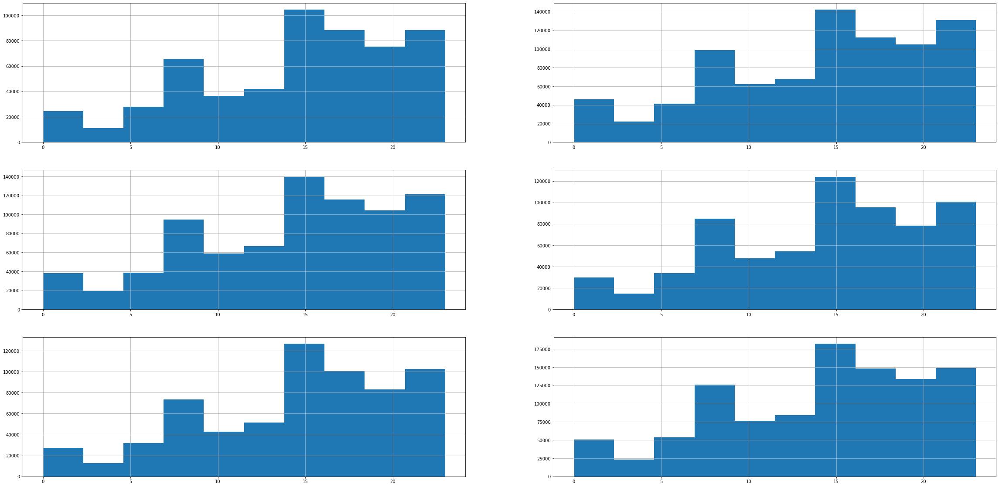

In [62]:
plt.figure(figsize=(40,20))

for i, month in enumerate(uber_df['month'].unique()):
    plt.subplot(3,2,i+1)
    uber_df[uber_df['month']==month]['hour'].hist()

In [63]:
!pip install chart_studio

In [64]:
#Analysis of which month has max rides
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [65]:
uber_df.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

In [66]:
trace1=go.Bar(
    x=uber_df.groupby('month')['hour'].count().index,
    y=uber_df.groupby('month')['hour'].count(),
    name='Priority'
)

In [67]:
iplot([trace1])

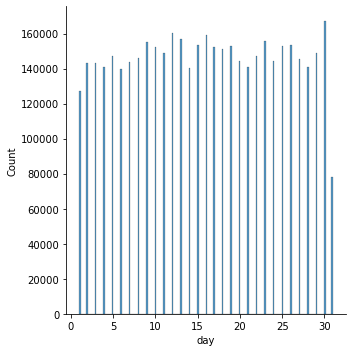

In [68]:
sns.displot(uber_df['day'])

Text(0.5, 1.0, 'Journey by month day')

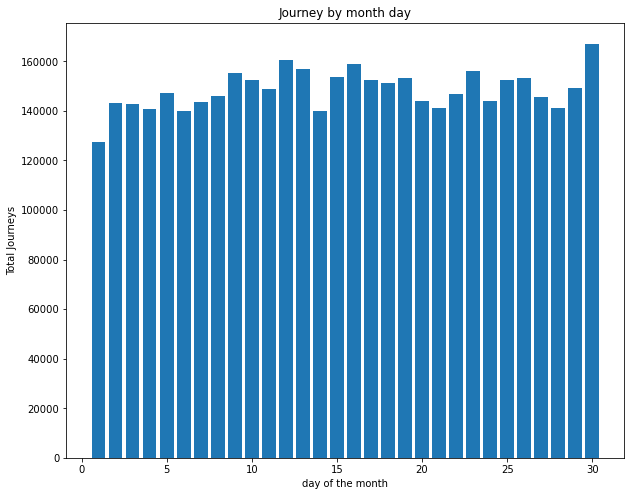

In [69]:
#Analysis of journey of each day

plt.figure(figsize=(10,8))
plt.hist(uber_df['day'],bins=30,rwidth=0.8, range=(0.5, 30.5))
plt.xlabel('day of the month')
plt.ylabel('Total Journeys')
plt.title('Journey by month day')

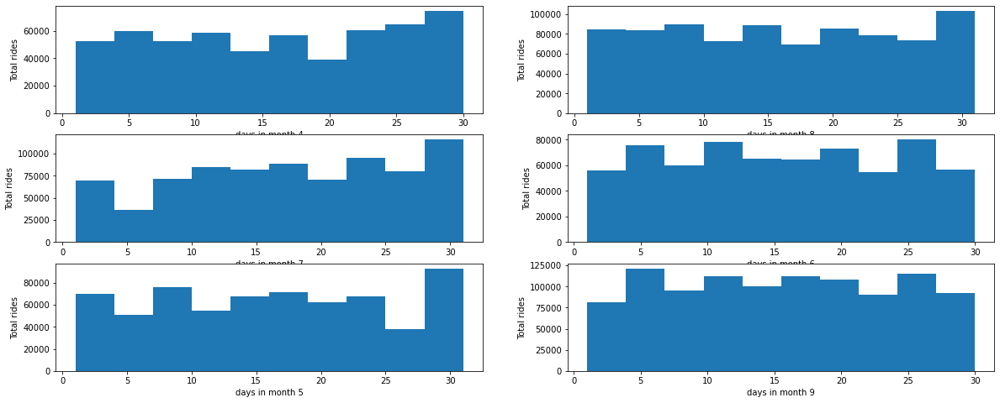

In [70]:
##Analysis of total rides month wise

plt.figure(figsize=(20,8))
for i,month in enumerate(uber_df['month'].unique(),1):
    plt.subplot(3,2,i)
    df_out=uber_df[uber_df['month']==month]
    plt.hist(df_out['day'])
    plt.xlabel('days in month {}'.format(month))
    plt.ylabel('Total rides')

Text(0.5, 1.0, 'Hours of day vs. passengers latitude')

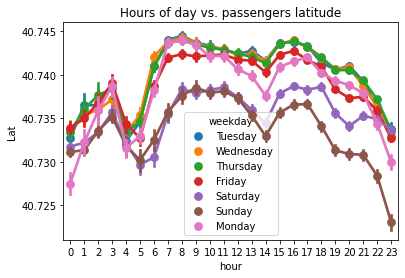

In [75]:
#Analysis of rush in hour

ax=sns.pointplot(x='hour', y='Lat', data=uber_df, hue='weekday')
ax.set_title('Hours of day vs. passengers latitude')

In [76]:
#Analysis of which base number gets popular by month name?

base=uber_df.groupby(['Base','month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

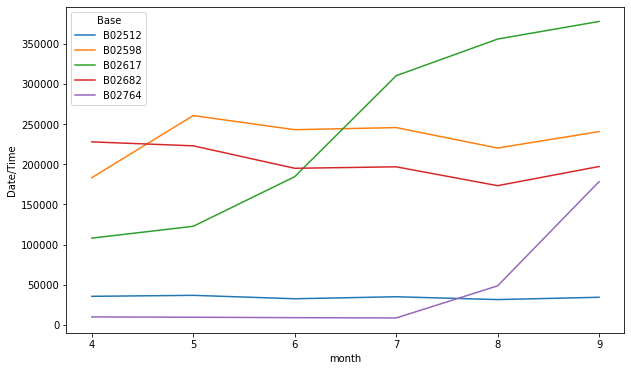

In [77]:
plt.figure(figsize=(10,6))
sns.lineplot(x='month', y='Date/Time', hue='Base', data=base)

In [78]:
#Performing cross analysis
#Heatmap by Hour and Weekday

def count_rows(rows):
    return len(rows)

In [79]:
cross_a=uber_df.groupby(['weekday','hour']).apply(count_rows)
cross_a

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [80]:
pivot=cross_a.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<AxesSubplot:xlabel='hour', ylabel='weekday'>

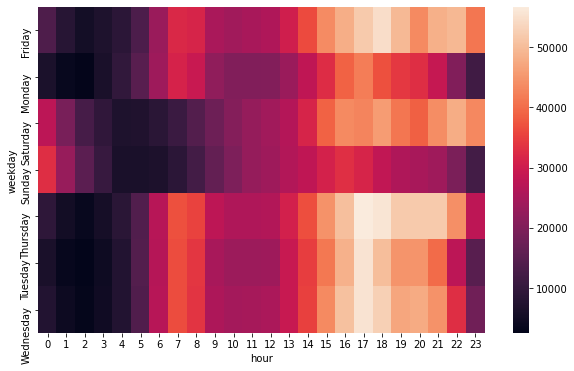

In [81]:
plt.figure(figsize=(10,6))
sns.heatmap(pivot)

In [82]:
#Heatmap by Hour and Day
def count_rows(rows):
    return len(rows)

cross_hd=uber_df.groupby(['day','hour']).apply(count_rows)
cross_hd

day  hour
1    0       3247
     1       1982
     2       1284
     3       1331
     4       1458
             ... 
31   19      5001
     20      4923
     21      5171
     22      5244
     23      4026
Length: 744, dtype: int64

In [83]:
pivot_1=cross_hd.unstack()
pivot_1

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,
1,3247,1982,1284,1331,1458,2171,3717,5470,5376,4688,...,7050,8033,8760,9661,8727,8146,7448,7960,6397,4128
2,2480,1600,1109,1442,1897,2861,5002,6646,6420,4795,...,7021,8581,10267,11301,11326,9654,8903,8506,7111,5247
3,3415,2176,1434,1489,1578,2437,4318,5775,5482,4732,...,7327,8991,10472,10665,11433,9765,9158,8646,7246,4767
4,2944,1718,1217,1449,1737,2623,4687,6146,5799,4814,...,7307,8678,9661,10550,10458,9296,8508,8804,7852,5224
5,2786,1567,1047,1278,1648,2958,4919,6379,6580,5616,...,7072,8453,9770,10887,10324,9582,9512,9785,9020,6640
6,4623,2932,1902,1599,1584,2201,3705,4846,5009,4482,...,7353,8751,9615,10130,9437,8575,8286,8734,8000,6061
7,3715,2326,1533,1622,1793,2464,4172,5649,5459,4706,...,7418,8624,10585,11185,10767,9674,8862,8692,7337,4902
8,2882,1672,1147,1509,1921,3282,5528,7474,7472,5770,...,7356,8910,10007,10871,9874,8964,8768,8528,6917,4331
9,2708,1757,1246,1501,1911,3227,5910,7720,7641,5983,...,7997,9360,10419,12116,11677,9979,9061,8806,7637,5290


<AxesSubplot:xlabel='hour', ylabel='day'>

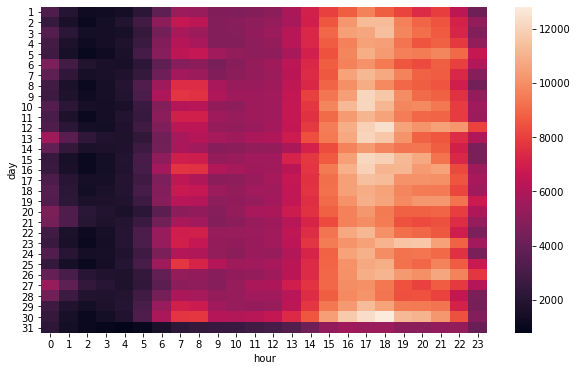

In [84]:
plt.figure(figsize=(10,6))
sns.heatmap(pivot_1)

<AxesSubplot:xlabel='day', ylabel='month'>

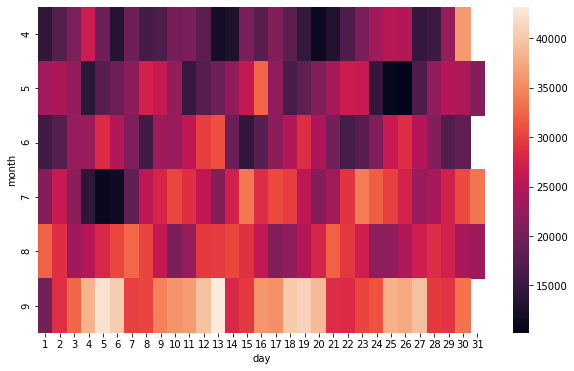

In [85]:
##Heatmap by Month and Day
cross_md=uber_df.groupby(['month','day']).apply(count_rows)
pivot_2=cross_md.unstack()
plt.figure(figsize=(10,6))
sns.heatmap(pivot_2)

<AxesSubplot:xlabel='weekday', ylabel='month'>

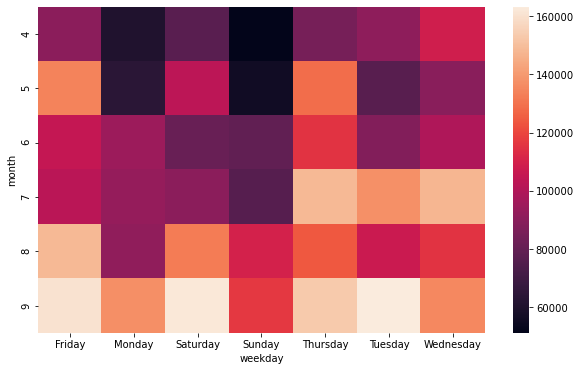

In [86]:
##Heatmap by Month and Weekday
cross_mw=uber_df.groupby(['month','weekday']).apply(count_rows)
pivot_3=cross_mw.unstack()
plt.figure(figsize=(10,6))
sns.heatmap(pivot_3)

In [87]:
#Analysis of location data points
uber_df.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,hour,minute
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,4,0,11
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,4,0,17
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,4,0,21
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,4,0,28
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,4,0,33


(40.5, 41.0)

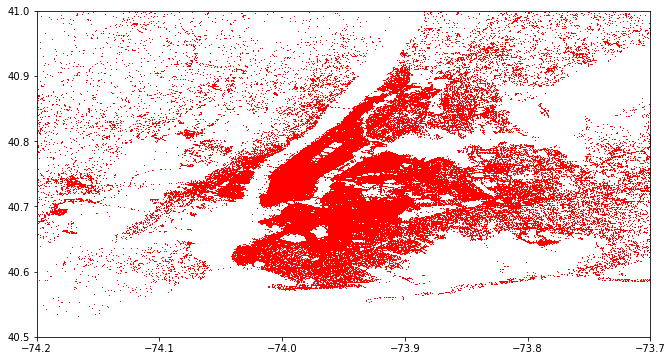

In [88]:
plt.figure(figsize=(11,6))
plt.plot(uber_df['Lon'],uber_df['Lat'],'r+',ms=0.5)
plt.xlim(-74.2,-73.7)
plt.ylim(40.5,41)

In [89]:
#Perform Spatial Analysis using heatmap to get a clear cut of Rush
df_out=uber_df[uber_df['weekday']=='Sunday']
df_out.shape

(490180, 9)

In [90]:
df_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,hour,minute
6965,2014-04-06 00:00:00,40.6547,-74.3033,B02512,Sunday,6,4,0,0
6966,2014-04-06 00:00:00,40.7356,-74.0006,B02512,Sunday,6,4,0,0
6967,2014-04-06 00:00:00,40.7421,-74.0041,B02512,Sunday,6,4,0,0
6968,2014-04-06 00:00:00,40.7401,-74.0053,B02512,Sunday,6,4,0,0
6969,2014-04-06 00:01:00,40.7368,-73.9877,B02512,Sunday,6,4,0,1


In [91]:
rush=df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index()

In [92]:
rush.columns=['Lat','Lon','Number of trips']
rush

,Lat,Lon,Number of trips
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [93]:
!pip install folium

In [94]:
from folium.plugins import HeatMap

In [95]:
import folium

In [96]:
plainmap=folium.Map()

In [97]:
HeatMap(rush,zoom=15, radius=15).add_to(plainmap)
plainmap

In [98]:
#Automate the analysis
def plot(uber_df,day):
    plainmap=folium.Map()
    df_out=uber_df[uber_df['weekday']==day]
    HeatMap(df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index(),zoom=15,radius=15).add_to(plainmap)
    return plainmap

In [99]:
plot(uber_df,'Thursday')

In [100]:
#Analysing Uber Pickups in Each Month
#Data Preparation

uber_jj15=pd.read_csv(r'C:\Users\ninic\Downloads\uber-pickups-in-new-york-city-20211117T154739Z-001\uber-pickups-in-new-york-city\uber-raw-data-janjune-15.csv')

In [101]:
uber_jj15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [102]:
uber_jj15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [103]:
uber_jj15['Pickup_date']=pd.to_datetime(uber_jj15['Pickup_date'],format='%Y-%m-%d %H:%M:%S')

In [104]:
uber_jj15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [105]:
uber_jj15['weekday']=uber_jj15['Pickup_date'].dt.day_name()
uber_jj15['day']=uber_jj15['Pickup_date'].dt.day
uber_jj15['month']=uber_jj15['Pickup_date'].dt.month
uber_jj15['hour']=uber_jj15['Pickup_date'].dt.hour
uber_jj15['minute']=uber_jj15['Pickup_date'].dt.minute

In [106]:
uber_jj15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,weekday,day,month,hour,minute
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,5,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,5,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,5,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,5,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,5,9,47


In [108]:
##Uber pickups by the month in NYC

uber_jj15['month'].value_counts()

6    2816895
5    2695553
4    2280837
2    2263620
3    2259773
1    1953801
Name: month, dtype: int64

In [109]:
fig = px.pie(uber_jj15, values=uber_jj15['month'].value_counts(), names=uber_jj15['month'].value_counts().index, title='Uber pickups by the month in NYC')
fig.show()

In [110]:
##Analysis of Rush in NYC
uber_jj15['hour'].value_counts()

19    1007464
18     987093
20     948574
21     930462
22     922954
17     863990
23     814789
16     737170
15     649414
0      602178
9      593437
14     584463
8      583348
13     537909
12     533021
10     520092
11     516716
7      443543
1      394510
6      288533
2      260603
5      193523
3      183655
4      173038
Name: hour, dtype: int64

C:\Users\ninic\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='hour', ylabel='count'>

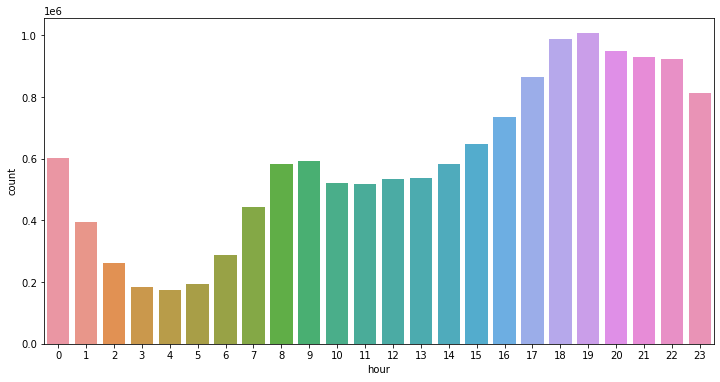

In [112]:
plt.figure(figsize=(12,6))
sns.countplot(uber_jj15['hour'])

In [114]:
##In-Depth Analysis of Rush in NYC by day and hour wise
rush_dh=uber_jj15.groupby(['weekday','hour'])['Pickup_date'].count().reset_index()
rush_dh.head()

,weekday,hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


In [116]:
rush_dh.columns=['weekday','hour','total_counts']
rush_dh.head()

,weekday,hour,total_counts
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


<AxesSubplot:xlabel='hour', ylabel='total_counts'>

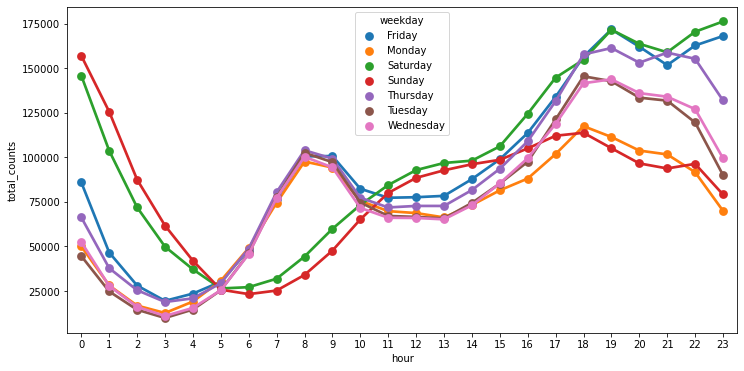

In [118]:
plt.figure(figsize=(12,6))
sns.pointplot(x='hour',y='total_counts',hue='weekday',data=rush_dh)

In [120]:
##In-Depth Analysis of Uber Base Number
uber_foil=pd.read_csv(r'C:\Users\ninic\Downloads\uber-pickups-in-new-york-city-20211117T154739Z-001\uber-pickups-in-new-york-city\Uber-Jan-Feb-FOIL.csv')

In [121]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [122]:
uber_foil.shape

(354, 4)

In [124]:
#Analysis of which base number has the most active vehicles
uber_foil['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

In [132]:
px.bar(uber_foil, x='dispatching_base_number',y='active_vehicles')

In [133]:
#Analysis of which base number has the most trips
px.bar(uber_foil, x='dispatching_base_number', y='trips')

In [134]:
#Analysis of how average trips/vehicles inc/decreases with dates with each base number

uber_foil['trips/vehicles']=uber_foil['trips']/uber_foil['active_vehicles']

In [135]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips,trips/vehicles
0,B02512,1/1/2015,190,1132,5.957895
1,B02765,1/1/2015,225,1765,7.844444
2,B02764,1/1/2015,3427,29421,8.585060
3,B02682,1/1/2015,945,7679,8.125926
4,B02617,1/1/2015,1228,9537,7.766287


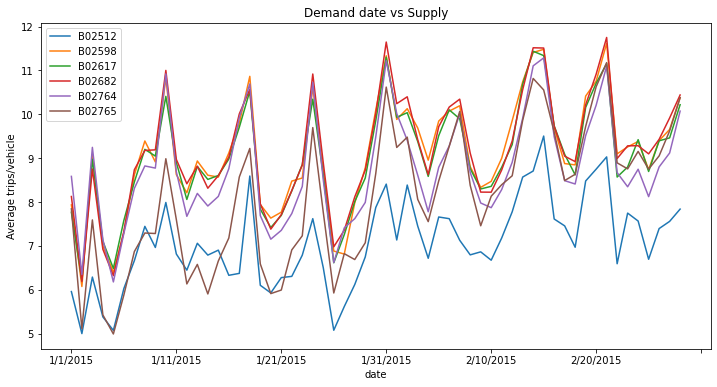

In [142]:
plt.figure(figsize=(12,6))
uber_foil.set_index('date').groupby(['dispatching_base_number'])['trips/vehicles'].plot()
plt.ylabel('Average trips/vehicle')
plt.title('Demand date vs Supply')
plt.legend()